In [1]:
# Package dependencies and suppress unnecessary warning messages 
from numba.core.errors import NumbaDeprecationWarning, NumbaPendingDeprecationWarning, NumbaWarning
import warnings

warnings.simplefilter('ignore', category=NumbaDeprecationWarning)
warnings.simplefilter('ignore', category=NumbaPendingDeprecationWarning)
warnings.simplefilter('ignore', category=NumbaWarning)

In [2]:
import scanpy as sc
import anndata as ad
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib

In [3]:
pd.set_option('display.max_columns', 40)
sc.set_figure_params(dpi=300)

In [4]:
batch_key = 'sample_name'

In [5]:
# Read data
adata_expr = sc.read_h5ad("e12_full_integrated.h5ad")


In [6]:
# Read data
# Contains counts for 500 cells per sample
adata = sc.read_h5ad("e12_full_integrated_regressed.h5ad")
print(adata)

AnnData object with n_obs × n_vars = 18203 × 26225
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'counts_outlier', 'genes_outlier', 'topgenes_outlier', 'mito_outlier', 'outlier', 'doublet_score', 'predicted_doublet', 'sample_id', 'sample_name', 'sample_group', 'S_score', 'G2M_score', 'phase'
    var: 'gene_ids', 'gene_name', 'mt', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'hvg', 'log1p', 'neighbors', 'pca', 'sample_name_colors', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap', 'X_umapraw'
    varm: 'PCs'
    layers: 'counts', 'logcounts'
    obsp: 'connectivities', 'distances'


In [7]:
sc.pp.neighbors(adata, use_rep="X_pca_harmony", n_neighbors=50, n_pcs=40)

In [8]:
resolutions = [0.1, 0.2]

# Perform Leiden clustering for each resolution and store the results with unique keys
for res in resolutions:
    key = f"leiden_res{res}"
    sc.tl.leiden(adata, resolution=res, key_added=key)

/tmp/ipykernel_630372/3536999960.py:6: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata, resolution=res, key_added=key)


In [9]:
sc.tl.umap(adata)

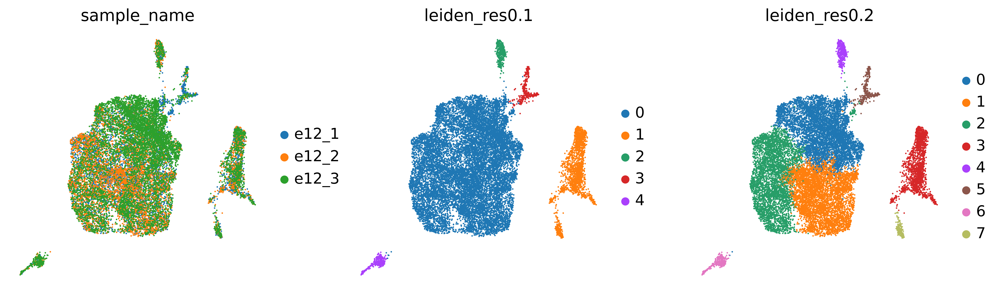

In [11]:
sc.pl.umap(adata,
           color=['sample_name', 'leiden_res0.1', 'leiden_res0.2'],
           wspace=0.2,
           frameon=False)

In [12]:
from sklearn.metrics import silhouette_score

# Loop through each Leiden resolution that we have computed and calculate the silhouette score
for res in resolutions:
    key = f"leiden_res{res}"
    score = silhouette_score(adata.obsm['X_pca_harmony'], adata.obs[key])  
    print(f"Silhouette Score for resolution {res}: {score:.4f}")

Silhouette Score for resolution 0.1: 0.1270
Silhouette Score for resolution 0.2: 0.0762


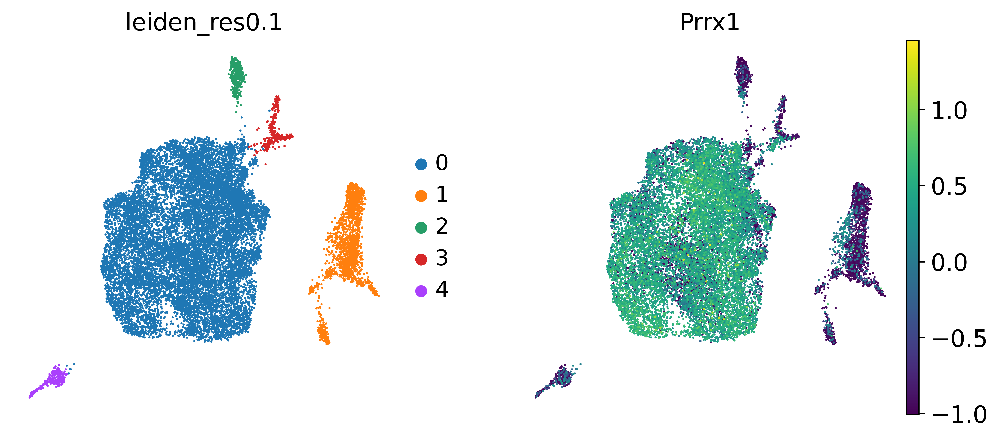

In [13]:
#mesenchyme
sc.pl.umap(adata, color=['leiden_res0.1', "Prrx1"],wspace=0.2,frameon=False)

In [13]:
adata_expr.obs['leiden_res0.15'] = adata.obs['leiden_res0.15']

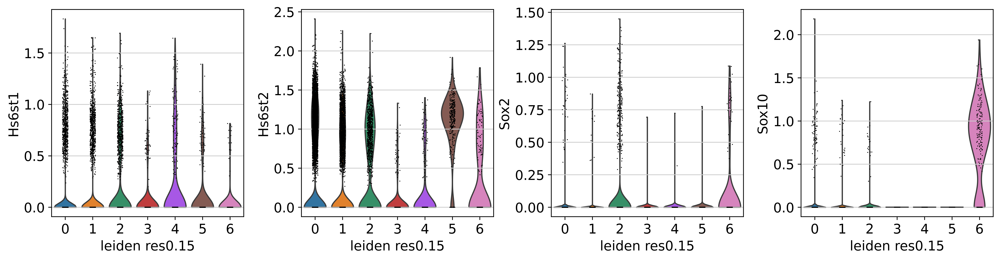

In [20]:
sc.pl.violin(adata_expr, ['Hs6st1', 'Hs6st2', 'Sox2', 'Sox10'], groupby='leiden_res0.15', color='leiden_res0.15', use_raw=False)

In [134]:
sc.tl.rank_genes_groups(adata_expr, groupby="leiden_res0.15", method="wilcoxon",key_added="rank_genes_groups_wilcoxon")

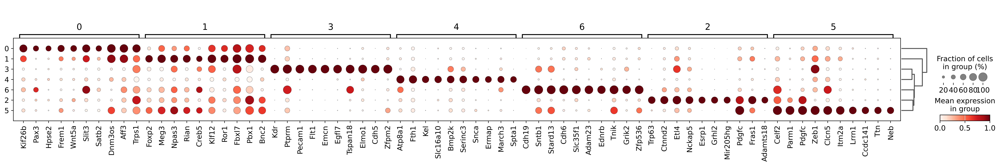

In [137]:
sc.pl.rank_genes_groups_dotplot(
    adata_expr, groupby="leiden_res0.15", standard_scale="var", n_genes=10, key="rank_genes_groups_wilcoxon"
)

In [17]:
#subclustering
clusters_to_exclude = ["0", "2", "3", "4", "5"]

mask_keep = ~adata.obs['leiden_res0.1'].isin(clusters_to_exclude)
adata_keep = adata[mask_keep].copy()




In [18]:
adata_keep

AnnData object with n_obs × n_vars = 1916 × 26225
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'counts_outlier', 'genes_outlier', 'topgenes_outlier', 'mito_outlier', 'outlier', 'doublet_score', 'predicted_doublet', 'sample_id', 'sample_name', 'sample_group', 'S_score', 'G2M_score', 'phase', 'leiden_res0.1', 'leiden_res0.2'
    var: 'gene_ids', 'gene_name', 'mt', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'hvg', 'log1p', 'neighbors', 'pca', 'sample_name_colors', 'umap', 'leiden_res0.1', 'leiden_res0.2', 'leiden_res0.1_colors', 'leiden_res0.2_colors'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap', 'X_umapraw'
    varm: 'PCs'
    layers: 'counts', 'logcounts'
    obsp: 'connectivities', 'distances'

In [19]:
sc.tl.umap(adata_keep)

In [20]:
resolutions_keep = [0.1, 0.2]
for res in resolutions_keep:
    key = f"leiden_res{res}"
    sc.tl.leiden(adata_keep, resolution=res, key_added=key)

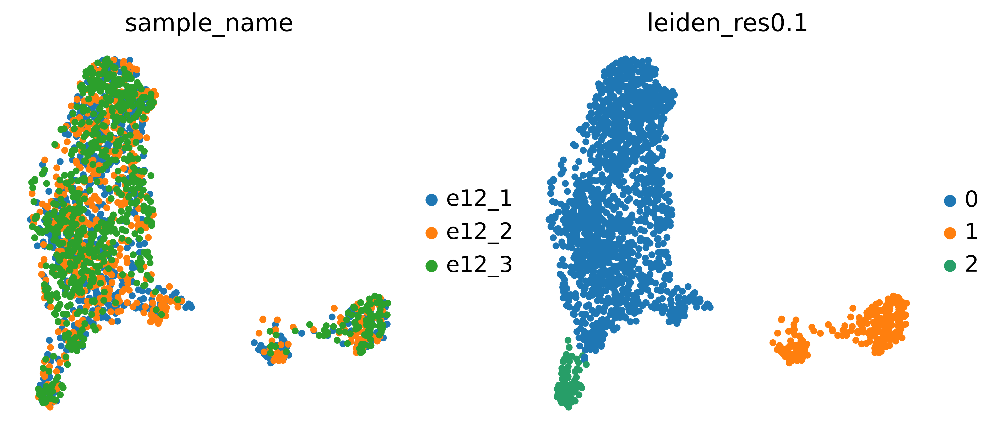

In [21]:
sc.pl.umap(adata_keep, color=['sample_name','leiden_res0.1'], wspace=0.2,frameon=False)

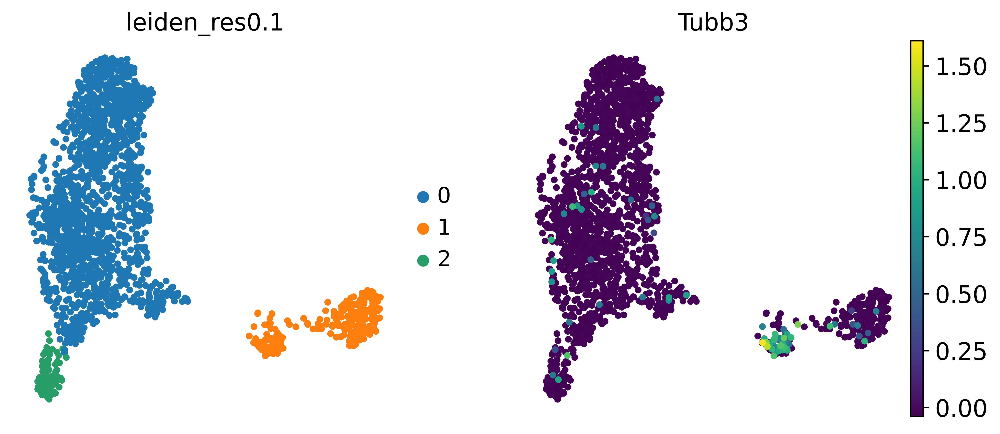

In [22]:
#neurons
sc.pl.umap(adata_keep, color=['leiden_res0.1', "Tubb3"],wspace=0.2,frameon=False)

In [76]:
# Tieni tutto tranne i cluster da escludere
#mask_keep_expr = ~adata_keep.obs['leiden_res0.5'].isin(clusters_to_exclude)
#adata_keep_expr = adata[mask_keep_expr].copy()


adata_expr.obs['leiden_res0.2'] = adata_keep.obs['leiden_res0.2']

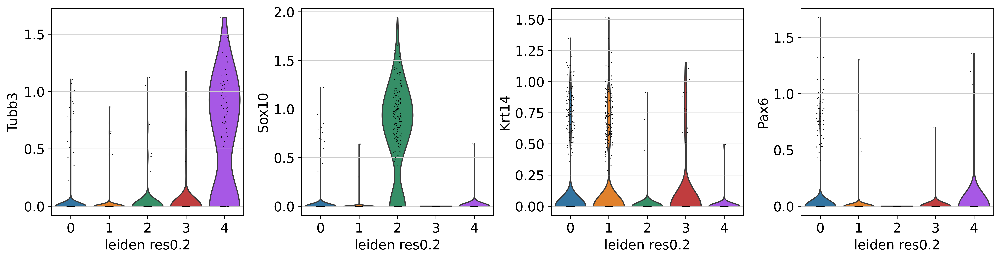

In [79]:
sc.pl.violin(adata_expr, ['Tubb3'], groupby='leiden_res0.2', color='leiden_res0.2', use_raw=False, legend=False)

In [80]:
sc.tl.rank_genes_groups(adata_expr, groupby="leiden_res0.2", method="wilcoxon",key_added="rank_genes_groups_wilcoxon")

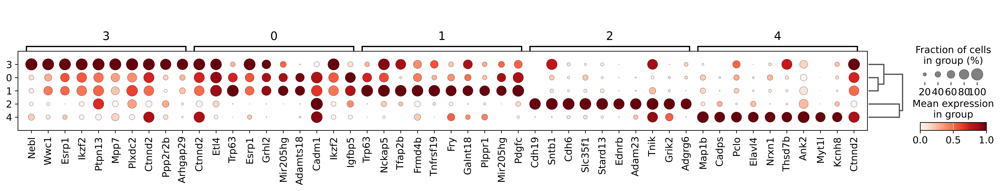

In [81]:
sc.pl.rank_genes_groups_dotplot(
    adata_expr, groupby="leiden_res0.2", standard_scale="var", n_genes=10, key="rank_genes_groups_wilcoxon"
)

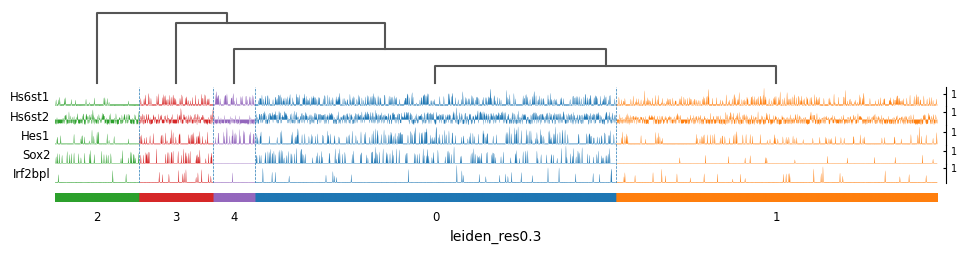

In [66]:
sc.pl.tracksplot(adata_keep, ["Hs6st1", "Hs6st2", "Hes1", "Sox2", "Irf2bpl"], groupby="leiden_res0.3", dendrogram=True)